In [1]:
import pandas as pd
import numpy as np 
from matplotlib import pyplot as plt
import opendssdirect as dss
import plotly.graph_objects as go 
import math

In [2]:
# Cargamos los archivos
DatosRed=pd.read_excel('Datos_red.xlsx',sheet_name='Datos generales')
gen = pd.read_csv('Perfil_solar.csv', header=None)
cargas = pd.read_csv('Perfiles_CREST.csv', header=None, delimiter=';')
Lineas = pd.read_excel('Datos_red.xlsx',sheet_name='Lineas')
Nodos = pd.read_excel('Datos_red.xlsx',sheet_name='Nodos')
Conductores = pd.read_excel('Datos_red.xlsx',sheet_name='LineCodes')
# El voltaje base será:
Vbase = DatosRed.loc[0,'Tensión [kV]']

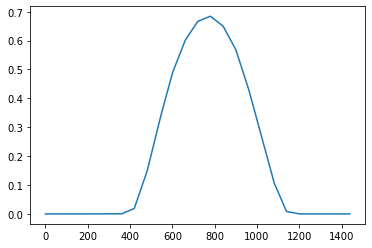

In [16]:
# Se pasa el perfil solar a txt
gen_sol = gen.iloc[:,0].to_numpy()
np.savetxt('Perfil_Solar_Base.txt',gen_sol,fmt='%10.5f')
#for i in gen_sol:
#    print(i)

#Haremos un gráfico para comprobar que está bien
plt.plot(range(len(gen_sol)),gen_sol)

In [6]:
Lineas

,Bus1,Bus2,Length [km],LineCode,Name
0,5518052,5522113,0.02170,clsccu3c240000,2409436
1,5522113,162203,0.02296,clsccu3c240000,2409437
2,162203,162204,0.07938,clsccu3c240000,2409438
3,162204,162205,0.05564,clsccu3c240000,2409439
4,162205,162207,0.00778,clsccu3c240000,2409441
...,...,...,...,...,...
2106,6413238,6413239,0.02480,cdacal3c070000,381589653
2107,6413239,6413240,0.01916,cdacal3c070000,381589659
2108,6413240,6416060,0.01968,cdacal3c070000,381589660
2109,6416060,6413241,0.01250,cdacal3c070000,381596207


In [7]:
Nodos

,Bus,coord x [UTM],coord y [UTM],Wkt,Capacidad Transformador [KVA],Clientes
0,5518052,338853.924,6317743.013,POINT(6317743.013 338853.924),0,0
1,5522113,338871.881,6317752.626,POINT(6317752.626 338871.881),0,0
2,162203,338863.393,6317772.431,POINT(6317772.431 338863.393),0,0
3,162204,338798.032,6317736.697,POINT(6317736.697 338798.032),0,0
4,162205,338824.415,6317686.831,POINT(6317686.831 338824.415),0,0
...,...,...,...,...,...,...
2107,6413244,329737.082,6326002.480,POINT(6326002.48 329737.082),0,0
2108,600004782,339999.756,6323951.853,POINT(6323951.853 339999.756),0,0
2109,600003114,340232.311,6321629.194,POINT(6321629.194 340232.311),0,0
2110,600003493,332661.786,6330205.164,POINT(6330205.164 332661.786),0,0


In [50]:
# Crear perfiles de Carga
fig = go.Figure()
#recorremos todos los nodos
for i in range(len(Nodos)):
    Nodo = Nodos.iloc[i,0]
    S_kva = Nodos.iloc[i,4] # potencia del trafo
    clientes = int(S_kva/2) # numero de clientes
    perfil = []
    if(clientes>0): # en caso de tener clientes, se guarda el perfil
        perfil = cargas.sample(clientes,axis=1,replace=True)
        perfil.reset_index(inplace=True)
        demanda = []
        for j in range(1440):
            d = perfil.iloc[j,:]
            demanda.append(np.sum(d))
        perfil = demanda
        fig.add_trace(go.Scatter(y=perfil, mode='lines', name='Perfil'+str(i)))
        np.savetxt('Perfil{}.txt'.format(i),perfil,fmt='%10.5f')

In [53]:
fig

In [14]:
fdp=0.95
P=1
S=P/fdp
angulo=math.sin(math.acos(fdp))
Q=S*angulo
Q
kW=P/1000
kvar=Q/1000
print(kW,kvar)

0.001 0.00032868410517886316


In [63]:
# Comenzamos con el código
dss.run_command('Redirect Tarea2.dss')
dss.run_command('clear')
dss.run_command('Set DefaultBaseFrequency=50')
dss.run_command('new loadshape.PerfilPV npts=1440 interval=0.016667 csvfile=Perfil_solar.csv')
dss.run_command('New circuit.Tarea2 basekV={} pu=1.02 angle=0 frequency=50 phases=3'.format(str(Vbase)))

''

In [64]:
#print('New circuit.Tarea2 basekV={} pu=1.02 angle=0 frequency=50 phases=3'.format(str(Vbase)))

New circuit.Tarea2 basekV=23 pu=1.02 angle=0 frequency=50 phases=3


In [9]:
# Comenzamos a definir bien las líneas
# paraesto debemos crear los tipos de linea como sigue
tipos = Lineas['LineCode'].unique()
x = 0
for cable in range(len(Conductores)):
    name = Conductores.iloc[cable,0]
    if name in tipos:
        #extraemos los valores de r1,r0,x1 y x0
        R1 = Conductores.iloc[cable,1]
        R0 = Conductores.iloc[cable,2]
        X1 = Conductores.iloc[cable,3]
        X0 = Conductores.iloc[cable,4]
        # se crea el linecode
        code = 'new linecode.{} nphases=3 R0={} R1={} X0={} X1={} units=km'.format(str(name),R0,R1,X0,X1)
        dss.run_command(code) # se corre el codigo   

In [12]:
# ya con los linecodes creados crearemos las lineas

for i in range(len(Lineas)):
    # sacamos los parametros de cada linea
    ID = Lineas.loc[i,'Name']
    bus1 = Lineas.loc[i,'Bus1']
    bus2 = Lineas.loc[i,'Bus2']
    largo = Lineas.iloc[i,2]
    tipo = Lineas.loc[i,'LineCode']
    # creamos el codigo y se corre
    code = 'new line.Linea{} bus1={} bus2={} length={} phases=3 units=km linecode={}'.format(str(ID),str(bus1),str(bus2),str(largo),str(tipo))
    print(code)
    dss.run_command(code)
    # se crea ademas monitores para obtener voltajes y potencias
    code_pot = 'new Monitor.PL{} element=line.Linea{} terminal=1 mode=9 ppolar=no'.format(str(i),str(ID))
    dss.run_command(code_pot)
    code_v = 'new Monitor.VL{} element=line.Linea{} terminal=2 mode=0 ppolar=no'.format(str(i),str(ID))
    dss.run_command(code_v)
    

new line.Linea2409436 bus1=5518052 bus2=5522113 length=0.0217 phases=3 units=km linecode=clsccu3c240000
new line.Linea2409437 bus1=5522113 bus2=162203 length=0.02296 phases=3 units=km linecode=clsccu3c240000
new line.Linea2409438 bus1=162203 bus2=162204 length=0.07938 phases=3 units=km linecode=clsccu3c240000
new line.Linea2409439 bus1=162204 bus2=162205 length=0.05564 phases=3 units=km linecode=clsccu3c240000
new line.Linea2409441 bus1=162205 bus2=162207 length=0.00778 phases=3 units=km linecode=clsccu3c240000
new line.Linea2409444 bus1=162207 bus2=162208 length=0.0963 phases=3 units=km linecode=clsccu3c240000
new line.Linea2409445 bus1=162208 bus2=162209 length=0.0924 phases=3 units=km linecode=clsccu3c240000
new line.Linea2409446 bus1=162209 bus2=162212 length=0.1086 phases=3 units=km linecode=clsccu3c240000
new line.Linea2409448 bus1=162212 bus2=162213 length=0.11652 phases=3 units=km linecode=clsccu3c240000
new line.Linea2409449 bus1=162213 bus2=162214 length=0.15859 phases=3 unit

new line.Linea2279284 bus1=57967 bus2=57966 length=0.03224 phases=3 units=km linecode=cdaacu2c016000
new line.Linea382441372 bus1=6728948 bus2=6728950 length=0.04384 phases=3 units=km linecode=cdacal3c070000
new line.Linea2243597 bus1=7885 bus2=7883 length=0.06231 phases=3 units=km linecode=cdaccu3c021000
new line.Linea2243285 bus1=5638549 bus2=5638546 length=0.00392 phases=3 units=km linecode=clahal3c185000
new line.Linea2218391 bus1=7883 bus2=7884 length=0.05108 phases=3 units=km linecode=cdaccu3c021000
new line.Linea2279273 bus1=57966 bus2=57956 length=0.03445 phases=3 units=km linecode=cdaacu2c016000
new line.Linea2297683 bus1=72744 bus2=72743 length=0.04301 phases=3 units=km linecode=clahal3c185000
new line.Linea382441373 bus1=6728950 bus2=6728952 length=0.0502 phases=3 units=km linecode=cdacal3c070000
new line.Linea26833114 bus1=72743 bus2=6673512 length=0.0382 phases=3 units=km linecode=clahal3c185000
new line.Linea5894730 bus1=5638546 bus2=152800 length=0.03729 phases=3 units=k

new line.Linea5829548 bus1=5602267 bus2=5611069 length=0.04657 phases=3 units=km linecode=clahal3c300000
new line.Linea7337305 bus1=5977504 bus2=5872726 length=0.04617 phases=3 units=km linecode=clahal3c070000
new line.Linea7168286 bus1=5925710 bus2=64849 length=0.0181 phases=3 units=km linecode=cdaccu3c021000
new line.Linea6989311 bus1=5867406 bus2=6493998 length=0.04548 phases=3 units=km linecode=cdacal3c070000
new line.Linea5660542 bus1=4111482 bus2=5994656 length=0.01987 phases=3 units=km linecode=clahal3c300000
new line.Linea381517086 bus1=6378879 bus2=6378880 length=0.03604 phases=3 units=km linecode=cdacal3c070000
new line.Linea381591247 bus1=5611069 bus2=6423652 length=0.03173 phases=3 units=km linecode=clahal3c300000
new line.Linea2243175 bus1=64849 bus2=29387 length=0.06832 phases=3 units=km linecode=cdaccu3c021000
new line.Linea7337306 bus1=5872726 bus2=5977507 length=0.0215 phases=3 units=km linecode=clahal3c070000
new line.Linea7361158 bus1=5994656 bus2=5525460 length=0.03

In [15]:
# creamos ahora las cargas asociandolas a los perfiles creados
for i in range(len(Nodos)):
    Nodo = Nodos.iloc[i,0]
    S_kva = Nodos.iloc[i,4] # potencia del trafo
    clientes = int(S_kva/2) # numero de clientes
    # si hay clientes agregamos la carga
    if (clientes>0):
        # primero el load shape y luego la carga
        code_l_shape = 'new loadshape.PerfilDiario{} npts=1440 interval=0.016667 csvfile= Perfil{}.txt'.format(str(i),str(i))
        dss.run_command(code_l_shape)
        print(code_l_shape)
        code_load = 'new load.Load{} bus1={} phases=3 kV=12 kW={} kvar={} model=1 daily=PerfilDiario{} status=variable'.format(str(i),str(Nodo),str(kW),str(kvar),str(i))
        dss.run_command(code_load)
        # ahora creamos los monitores para extraer voltaje y potencia
        code_pot = 'new Monitor.PotenciaCarga{} element=load.Load{} terminal=1 mode=1 ppolar=no'.format(str(i),str(i))
        dss.run_command(code_pot)
        code_v = 'new Monitor.Vcarga{} element=load.Load{} terminal=2 mode=0 ppolar=no'.format(str(i),str(i))
        dss.run_command(code_v)
        

new loadshape.PerfilDiario55 npts=1440 interval=0.016667 csvfile= Perfil55.txt
new loadshape.PerfilDiario59 npts=1440 interval=0.016667 csvfile= Perfil59.txt
new loadshape.PerfilDiario71 npts=1440 interval=0.016667 csvfile= Perfil71.txt
new loadshape.PerfilDiario77 npts=1440 interval=0.016667 csvfile= Perfil77.txt
new loadshape.PerfilDiario89 npts=1440 interval=0.016667 csvfile= Perfil89.txt
new loadshape.PerfilDiario121 npts=1440 interval=0.016667 csvfile= Perfil121.txt
new loadshape.PerfilDiario137 npts=1440 interval=0.016667 csvfile= Perfil137.txt
new loadshape.PerfilDiario151 npts=1440 interval=0.016667 csvfile= Perfil151.txt
new loadshape.PerfilDiario173 npts=1440 interval=0.016667 csvfile= Perfil173.txt
new loadshape.PerfilDiario184 npts=1440 interval=0.016667 csvfile= Perfil184.txt
new loadshape.PerfilDiario186 npts=1440 interval=0.016667 csvfile= Perfil186.txt
new loadshape.PerfilDiario188 npts=1440 interval=0.016667 csvfile= Perfil188.txt
new loadshape.PerfilDiario193 npts=144

new loadshape.PerfilDiario748 npts=1440 interval=0.016667 csvfile= Perfil748.txt
new loadshape.PerfilDiario752 npts=1440 interval=0.016667 csvfile= Perfil752.txt
new loadshape.PerfilDiario755 npts=1440 interval=0.016667 csvfile= Perfil755.txt
new loadshape.PerfilDiario758 npts=1440 interval=0.016667 csvfile= Perfil758.txt
new loadshape.PerfilDiario764 npts=1440 interval=0.016667 csvfile= Perfil764.txt
new loadshape.PerfilDiario775 npts=1440 interval=0.016667 csvfile= Perfil775.txt
new loadshape.PerfilDiario789 npts=1440 interval=0.016667 csvfile= Perfil789.txt
new loadshape.PerfilDiario801 npts=1440 interval=0.016667 csvfile= Perfil801.txt
new loadshape.PerfilDiario805 npts=1440 interval=0.016667 csvfile= Perfil805.txt
new loadshape.PerfilDiario808 npts=1440 interval=0.016667 csvfile= Perfil808.txt
new loadshape.PerfilDiario809 npts=1440 interval=0.016667 csvfile= Perfil809.txt
new loadshape.PerfilDiario811 npts=1440 interval=0.016667 csvfile= Perfil811.txt
new loadshape.PerfilDiario81

new loadshape.PerfilDiario1479 npts=1440 interval=0.016667 csvfile= Perfil1479.txt
new loadshape.PerfilDiario1484 npts=1440 interval=0.016667 csvfile= Perfil1484.txt
new loadshape.PerfilDiario1493 npts=1440 interval=0.016667 csvfile= Perfil1493.txt
new loadshape.PerfilDiario1509 npts=1440 interval=0.016667 csvfile= Perfil1509.txt
new loadshape.PerfilDiario1512 npts=1440 interval=0.016667 csvfile= Perfil1512.txt
new loadshape.PerfilDiario1516 npts=1440 interval=0.016667 csvfile= Perfil1516.txt
new loadshape.PerfilDiario1522 npts=1440 interval=0.016667 csvfile= Perfil1522.txt
new loadshape.PerfilDiario1537 npts=1440 interval=0.016667 csvfile= Perfil1537.txt
new loadshape.PerfilDiario1544 npts=1440 interval=0.016667 csvfile= Perfil1544.txt
new loadshape.PerfilDiario1555 npts=1440 interval=0.016667 csvfile= Perfil1555.txt
new loadshape.PerfilDiario1579 npts=1440 interval=0.016667 csvfile= Perfil1579.txt
new loadshape.PerfilDiario1583 npts=1440 interval=0.016667 csvfile= Perfil1583.txt
new 

In [ ]:
# perfiles de generacion
for i in range(len(Nodos)):
    Nodo = Nodos.iloc[i,0]
    S_kva = Nodos.iloc[i,4] # potencia del nodo
    clientes = int(S_kva/2) # numero de clientes
    # si hay clientes agregamos la generacion
    if(clientes > 0):
        gen = 'new generator.Gen{} bus1={} phases=3 kV=12 kW={} kvar=0 model=1 daily=PerfilPV status=variable'.format(str(i),str(Nodo),str(0))
        print(gen)
        dss.run_command(gen)
        code_gen = 'new Monitor.Generacion{} element=generator.Gen{} terminal=1 mode=1 ppolar=no'.format(str(i),str(i))
        dss.run_command(code_gen)
        

In [36]:
i=55
Nodo = Nodos.iloc[i,0]
S_kva = Nodos.iloc[i,4]
clientes = int(S_kva/2)
print(clientes)
perfil = cargas.sample(clientes,axis=1)
perfil.reset_index(inplace=True)

150


In [37]:
perfil

,index,539,737,786,726,270,486,840,945,727,...,898,369,151,922,352,808,729,766,522,984
0,0,63,65,67,44,68,64,69,69,59,...,60,67,56,58,56,69,58,59,62,55
1,1,63,55,67,44,68,64,69,69,59,...,60,67,56,58,56,69,58,59,62,55
2,2,63,55,67,44,108,64,69,59,59,...,60,67,56,58,56,69,58,59,62,55
3,3,63,55,67,44,148,64,69,59,59,...,60,67,56,118,56,69,58,59,62,55
4,4,63,55,67,44,148,64,59,59,59,...,60,67,56,118,56,69,48,59,62,55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1435,1435,282,638,655,472,70,270,69,69,59,...,60,445,56,235,56,715,172,264,240,55
1436,1436,297,598,655,472,70,270,69,69,59,...,60,445,56,235,56,715,172,264,240,55
1437,1437,297,598,478,472,70,270,69,69,59,...,60,445,56,235,56,735,172,264,62,55
1438,1438,287,618,478,472,70,260,69,69,59,...,60,445,56,295,56,735,58,264,62,55


index     0
539      63
737      65
786      67
726      44
         ..
808      69
729      58
766      59
522      62
984      55
Name: 0, Length: 151, dtype: int64

In [40]:
np.sum(d)

12565

In [34]:
perfil.reset_index(inplace=True)

ValueError: cannot insert level_0, already exists